# Drift Detection Example

data:
    https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/

In [8]:
import drift

In [9]:
import pandas as pd
import numpy as np

In [10]:
df = pd.read_csv('data/winequality-white.csv', sep=";")

columns used in to evaluate drift

In [11]:
columns = ['fixed acidity', 'volatile acidity',]

In [12]:
df = df[columns]

In [13]:
df.isna().sum()

fixed acidity       0
volatile acidity    0
dtype: int64

In [14]:
df.shape

(4898, 2)

Training dataset, which has "normal" data.

The important thing is the size of the training dataset, since it is the one that determines the size that will be taken into account in future predictions, that is, if the size of the prediction dataset is smaller, an oversampling is carried out, if it is larger, it is carried out. a stratified sample with clustering

a stratified sampling is performed on the training data, parameter sample_size

In [15]:
drift_estimator = drift.DriftEstimator(delta=0.05, sample_size=0.5)

In [16]:
import numpy as np

The number of clusters used in the stratification of the sample is obtained, it is obtained automatically using the elbow method, the sample_size parameter was established

cluster sampling
shape cluster sample (2449, 2)


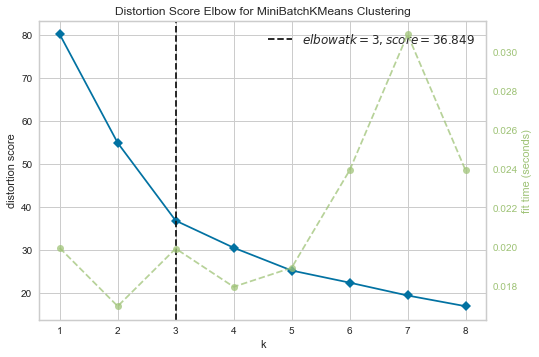

In [17]:
drift_estimator.fit(df)

the drift should tend to 0 in training

In [18]:
drift_estimator.drift_average

0.0

drift adjustment displayed during training for each column

In [19]:
drift_estimator.plot_train()

we observe the percentage of drift of each column

In [14]:
drift_estimator.percentage

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

statistics of the values of each column-

In [20]:
drift_estimator.describe_fit

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.294135
mean_volatile acidity      0.213067
std_fixed acidity          0.082582
std_volatile acidity       0.107551
dtype: float64

we look at the size of the trained dataset. the same size will be used in future predictions

In [21]:
drift_estimator.size

2449

as you can see, it is 50% of the size of the original dataset

In [22]:
df.shape

(4898, 2)

Now we predict on the same training dataset, a sample will automatically be taken that matches the size of the training dataset.

what is aspired is that before "same" datasets there is no drift

In [23]:
drift_estimator.predict(df)

cluster sampling
shape cluster sample (2449, 2)


0.0

As can be seen, the average drift that is predicted is 0, which means that there is no drift (or it is very low).

In [19]:
drift_estimator.drift_average_predict

0.0

we can observe the total of drifts found in each column

In [20]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

now the drift percentage of each column

In [24]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

and the statistics of each column

In [22]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.287139
mean_volatile acidity      0.213985
std_fixed acidity          0.080796
std_volatile acidity       0.106755
dtype: float64

we visualize the training drift adjustment versus the drift of the prediction dataset

In [23]:
drift_estimator.plot_predict()

we visualize the statistics by comparing those of training with those of the prediction (the value of changes is 0)

In [24]:
drift_estimator.plot_describe()

If we predict again, we can see that the model does not memorize the data of the last prediction, but that it preserves the behavior of the first training, that is, it does not learn from the new data.

In [26]:
drift_estimator.predict(df)

cluster sampling
shape cluster sample (2449, 2)


0.0

In [27]:
drift_estimator.drift_average_predict

0.0

In [28]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [29]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [30]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.293858
mean_volatile acidity      0.214433
std_fixed acidity          0.081524
std_volatile acidity       0.108365
dtype: float64

In [31]:
drift_estimator.plot_predict()

In [32]:
drift_estimator.plot_describe()


now let's load a dataset with drift

In [33]:
df2 = pd.read_csv('data/winequality-red.csv', sep=";")

we select the same columns as the training dataset

In [35]:
df2 = df2[columns]

We see that the prediction dataset has fewer rows than the training dataset. but we must not do anything, the data is automatically oversampled to match the training

In [38]:
df2.shape

(1599, 2)

In [39]:
drift_estimator.size

2449

In [41]:
drift_estimator.predict(df2)

resample
shape resample (2449, 2)
shape cluster sample (2449, 2)


C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt



2.4091465904450797

the warnings of "invalid value found in sqrt" are due to the existence of imaginary numbers from which the root cannot be obtained

the average drift is approximately 2, it means that there is a difference between the data

In [43]:
drift_estimator.drift_average_predict

2.4091465904450797

we see the amount of drifts found

In [47]:
drift_estimator.totals_predict

change_fixed acidity       45.0
change_volatile acidity    73.0
dtype: float64

In [48]:
drift_estimator.percentage_predict

change_fixed acidity       1.837485
change_volatile acidity    2.980808
dtype: float64

In [49]:
drift_estimator.describe_predict

change_fixed acidity       1.837485
change_volatile acidity    2.980808
mean_fixed acidity         0.325641
mean_volatile acidity      0.310696
std_fixed acidity          0.146476
std_volatile acidity       0.135148
dtype: float64

In [50]:
drift_estimator.plot_predict()

In [51]:
drift_estimator.plot_describe()

we create a third dataset with totally bad data

In [56]:
df3 = df2[columns].copy()

In [57]:
df3[columns] = 10**3.141592653589793

In [58]:
drift_estimator.predict(df3)

resample
shape resample (2449, 2)
shape cluster sample (2449, 2)


C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt



3.10330747243773

In [59]:
drift_estimator.drift_average_predict

3.10330747243773

In [60]:
drift_estimator.totals_predict

change_fixed acidity       76.0
change_volatile acidity    76.0
dtype: float64

In [61]:
drift_estimator.percentage_predict

change_fixed acidity       3.103307
change_volatile acidity    3.103307
dtype: float64

In [62]:
drift_estimator.describe_predict

change_fixed acidity       3.103307
change_volatile acidity    3.103307
mean_fixed acidity         0.000000
mean_volatile acidity      0.000000
std_fixed acidity          0.000000
std_volatile acidity       0.000000
dtype: float64

In [63]:
drift_estimator.plot_predict()

In [64]:
drift_estimator.plot_describe()

we reload the original dataset

In [82]:
df = pd.read_csv('data/winequality-white.csv', sep=";")

In [83]:
df = df[columns]

In [84]:
drift_estimator.predict(df)

cluster sampling
shape cluster sample (2449, 2)


0.0

In [85]:
drift_estimator.drift_average_predict

0.0

In [86]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [87]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [88]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.294759
mean_volatile acidity      0.213139
std_fixed acidity          0.081597
std_volatile acidity       0.108428
dtype: float64

In [89]:
drift_estimator.plot_predict()

In [90]:
drift_estimator.plot_describe()

we train a new model but now giving different weights to each column, which affects the drift average, in this case a weighted average

In [99]:
drift_estimator = drift.DriftEstimator(delta=0.05, sample_size=1000, list_of_weights=[0.5, 2])

cluster sampling
shape cluster sample (1000, 2)


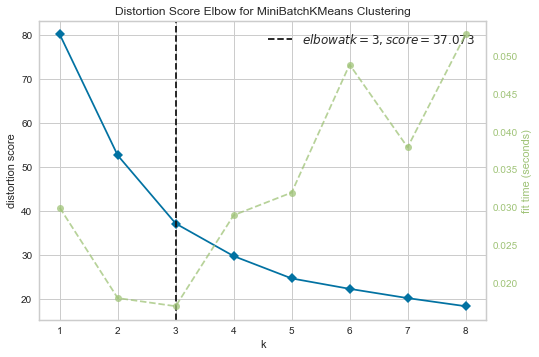

In [100]:
drift_estimator.fit(df)

In [102]:
drift_estimator.drift_average

0.0

In [101]:
drift_estimator.plot_train()

In [103]:
drift_estimator.percentage

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [104]:
drift_estimator.describe_fit

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.349868
mean_volatile acidity      0.294088
std_fixed acidity          0.110022
std_volatile acidity       0.145543
dtype: float64

In [112]:
drift_estimator.totals

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [108]:
drift_estimator.predict(df2)

cluster sampling
shape cluster sample (1000, 2)


C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:331: RuntimeWarning:

divide by zero encountered in double_scalars

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:331: RuntimeWarning:

divide by zero encountered in double_scalars



2.5200000000000005

In [110]:
drift_estimator.percentage_predict

change_fixed acidity       0.2
change_volatile acidity    3.1
dtype: float64

In [111]:
drift_estimator.totals_predict

change_fixed acidity        2.0
change_volatile acidity    31.0
dtype: float64

In [113]:
drift_estimator.plot_predict()